# Image Colorization with U-Net and GAN Tutorial

In [1]:
# from google.colab import drive
# drive.mount('/content/drive')

In [2]:
TRAIN_COLORIZATION = False
TRAIN_UPSAMPLING = False

In [3]:
import os

def is_colab():
    try:
        import google.colab
        return True
    except ImportError:
        return False

def is_kaggle():
    return os.path.exists('/kaggle/input')

if is_colab():
    print("Running on Google Colab")
    dir_path = '/content/drive/My Drive/'
elif is_kaggle():
    print("Running on Kaggle")
    dir_path = '/kaggle/working/'
else:
    print("Running on local machine")
    dir_path = ''

Running on local machine


## 1 - Coloriazation Generative Adversarial Network

In [4]:
import os
import cv2
from glob import glob
import numpy as np
from PIL import Image
from pathlib import Path
from tqdm import tqdm as tqdm
import matplotlib.pyplot as plt
from skimage.color import rgb2lab
import random

import torch
from torch import nn, optim
from torchvision import transforms, models
from torch.utils.data import Dataset, DataLoader, random_split
from torchvision.datasets import VOCSegmentation

In [5]:
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"The available device is: {DEVICE}")

The available device is: cpu


In [6]:
!pip install fastai

In [7]:
from fastai.data.external import untar_data, URLs
coco_path = untar_data(URLs.COCO_SAMPLE)
path = str(coco_path) + "/train_sample"

In [8]:
SIZE = 256
img_shape = (SIZE, SIZE)
epochs = 30
batch_size = 16
lr = 2e-4
b1 = 0.5
b2 = 0.999
channels = 3

In [9]:
paths = glob(path + "/*.jpg") # Grabbing all the image file names
np.random.seed(42)
dataset_paths = np.random.choice(paths, 10020, replace=False) # choosing 12000 images randomly
rand_idxs = np.random.permutation(10020)
train_idxs = rand_idxs[:10000]
test_idxs = rand_idxs[10000:]
train_paths = dataset_paths[train_idxs]
test_paths_colorization = dataset_paths[test_idxs]
print(len(train_paths), len(test_paths_colorization))

10000 20


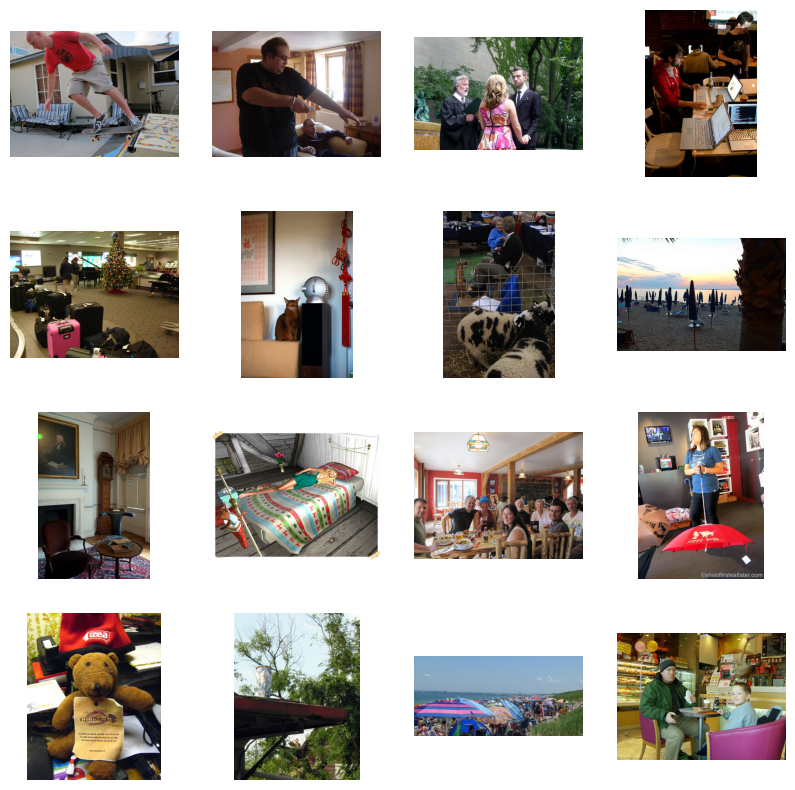

In [10]:
_, axes = plt.subplots(4, 4, figsize=(10, 10))
for ax, img_path in zip(axes.flatten(), dataset_paths):
    ax.imshow(Image.open(img_path))
    ax.axis("off")

In [11]:
os.makedirs(dir_path + "colorization_models", exist_ok=True)

### 1.1 - Making Datasets and DataLoaders

In [12]:
class ColorizationDataset(Dataset):
    """
    A custom dataset class for colorization.

    Args:
        files (list): A list of file paths to the images.
        img_shape (tuple): The desired shape of the images.

    Attributes:
        transforms (torchvision.transforms): Image transformation operations.
        files (list): A list of file paths to the images.

    """

    def __init__(self, files, img_shape):
        self.transforms = transforms.Resize(img_shape,  Image.BICUBIC)
        self.files = files

    def __getitem__(self, index):
        """
        Retrieves an item from the dataset.

        Args:
            index (int): The index of the item to retrieve.

        Returns:
            dict: A dictionary containing the 'L' (lightness) and 'ab' (color) channels of the image.

        """
        img = Image.open(self.files[index]).convert("RGB")
        img = self.transforms(img)
        img = np.array(img)
        img_lab = rgb2lab(img).astype("float32") # Converting RGB to L*a*b
        img_lab = transforms.ToTensor()(img_lab)
        L = img_lab[[0], ...] / 50. - 1. # Between -1 and 1
        ab = img_lab[[1, 2], ...] / 110. # Between -1 and 1

        return {'L': L, 'ab': ab}

    def __len__(self):
        """
        Returns the length of the dataset.

        Returns:
            int: The number of items in the dataset.

        """
        return len(self.files)


In [13]:
train_set = ColorizationDataset(train_paths, (64, 64))

train_size = int(0.8 * len(train_set))
val_size = len(train_set) - train_size
train_dataset, val_dataset = random_split(train_set, [train_size, val_size], generator=torch.Generator().manual_seed(42))

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)

print(len(train_loader), len(val_loader))

500 125


### 1.2 - Generator

In [14]:
class UnetBlock(nn.Module):
    """
    UnetBlock is a building block for the U-Net architecture.

    Args:
        nf (int): Number of output channels for the block.
        ni (int): Number of input channels for the block.
        submodule (nn.Module, optional): Submodule to be inserted between the down and up layers. Defaults to None.
        input_c (int, optional): Number of input channels for the down layer. Defaults to None.
        dropout (bool, optional): Whether to apply dropout to the up layers. Defaults to False.
        innermost (bool, optional): Whether the block is the innermost block. Defaults to False.
        outermost (bool, optional): Whether the block is the outermost block. Defaults to False.
    """

    def __init__(self, nf, ni, submodule=None, input_c=None, dropout=False,
                 innermost=False, outermost=False):
        super().__init__()
        self.outermost = outermost
        if input_c is None: input_c = nf
        downconv = nn.Conv2d(input_c, ni, kernel_size=4,
                             stride=2, padding=1, bias=False)
        downrelu = nn.LeakyReLU(0.2, True)
        downnorm = nn.BatchNorm2d(ni)
        uprelu = nn.ReLU(True)
        upnorm = nn.BatchNorm2d(nf)

        if outermost:
            upconv = nn.ConvTranspose2d(ni * 2, nf, kernel_size=4,
                                        stride=2, padding=1)
            down = [downconv]
            up = [uprelu, upconv, nn.Tanh()]
            model = down + [submodule] + up
        elif innermost:
            upconv = nn.ConvTranspose2d(ni, nf, kernel_size=4,
                                        stride=2, padding=1, bias=False)
            down = [downrelu, downconv]
            up = [uprelu, upconv, upnorm]
            model = down + up
        else:
            upconv = nn.ConvTranspose2d(ni * 2, nf, kernel_size=4,
                                        stride=2, padding=1, bias=False)
            down = [downrelu, downconv, downnorm]
            up = [uprelu, upconv, upnorm]
            if dropout: up += [nn.Dropout(0.5)]
            model = down + [submodule] + up
        self.model = nn.Sequential(*model)

    def forward(self, x):
        if self.outermost:
            return self.model(x)
        else:
            return torch.cat([x, self.model(x)], 1)

class Unet(nn.Module):
    """
    U-Net architecture for image segmentation.

    Args:
        input_c (int): Number of input channels. Default is 1.
        output_c (int): Number of output channels. Default is 2.
        n_down (int): Number of downsampling layers. Default is 8.
        num_filters (int): Number of filters in the first layer. Default is 64.
    """

    def __init__(self, input_c=1, output_c=2, n_down=8, num_filters=64):
        super().__init__()
        unet_block = UnetBlock(num_filters * 8, num_filters * 8, innermost=True)
        for _ in range(n_down - 5):
            unet_block = UnetBlock(num_filters * 8, num_filters * 8, submodule=unet_block, dropout=True)
        out_filters = num_filters * 8
        for _ in range(3):
            unet_block = UnetBlock(out_filters // 2, out_filters, submodule=unet_block)
            out_filters //= 2
        self.model = UnetBlock(output_c, out_filters, input_c=input_c, submodule=unet_block, outermost=True)

    def forward(self, x):
        return self.model(x)

### 1.3- Discriminator

In [15]:
class PatchDiscriminator(nn.Module):
    """
    PatchDiscriminator class represents a discriminator model for patch-based image discrimination.

    Args:
        input_c (int): Number of input channels.
        num_filters (int): Number of filters in the first layer (default: 64).
        n_down (int): Number of downsampling layers (default: 3).

    Attributes:
        model (nn.Sequential): Sequential model containing the layers of the discriminator.

    Methods:
        get_layers: Helper method to create a block of convolutional layers.
        forward: Forward pass of the discriminator.

    """

    def __init__(self, input_c, num_filters=64, n_down=3):
        super().__init__()
        model = [self.get_layers(input_c, num_filters, norm=False)]
        model += [self.get_layers(num_filters * 2 ** i, num_filters * 2 ** (i + 1), s=1 if i == (n_down-1) else 2)
                          for i in range(n_down)] # the 'if' statement is taking care of not using
                                                  # stride of 2 for the last block in this loop
        model += [self.get_layers(num_filters * 2 ** n_down, 1, s=1, norm=False, act=False)] # Make sure to not use normalization or
                                                                                             # activation for the last layer of the model
        self.model = nn.Sequential(*model)

    def get_layers(self, ni, nf, k=4, s=2, p=1, norm=True, act=True): # when needing to make some repeatitive blocks of layers,
        """
        Helper method to create a block of convolutional layers.

        Args:
            ni (int): Number of input channels.
            nf (int): Number of output channels.
            k (int): Kernel size (default: 4).
            s (int): Stride (default: 2).
            p (int): Padding (default: 1).
            norm (bool): Whether to use batch normalization (default: True).
            act (bool): Whether to use activation function (default: True).

        Returns:
            nn.Sequential: Sequential model containing the layers.

        """
        layers = [nn.Conv2d(ni, nf, k, s, p, bias=not norm)]          # it's always helpful to make a separate method for that purpose
        if norm: layers += [nn.BatchNorm2d(nf)]
        if act: layers += [nn.LeakyReLU(0.2, True)]
        return nn.Sequential(*layers)

    def forward(self, x):
        return self.model(x)

### 1.4 - GAN Loss

In [16]:
class GANLoss(nn.Module):
    """
    GANLoss is a class that defines the loss function for a GAN (Generative Adversarial Network).

    Args:
        gan_mode (str): The mode of the GAN loss. Possible values are 'vanilla' and 'lsgan'.
        real_label (float): The label value for real samples. Default is 1.0.
        fake_label (float): The label value for fake samples. Default is 0.0.
    """

    def __init__(self, gan_mode='vanilla', real_label=1.0, fake_label=0.0):
        super().__init__()
        self.register_buffer('real_label', torch.tensor(real_label))
        self.register_buffer('fake_label', torch.tensor(fake_label))
        if gan_mode == 'vanilla':
            self.loss = nn.BCEWithLogitsLoss()
        elif gan_mode == 'lsgan':
            self.loss = nn.MSELoss()

    def get_labels(self, preds, target_is_real):
        """
        Returns the target labels based on whether the target is real or fake.

        Args:
            preds (torch.Tensor): The predicted values.
            target_is_real (bool): Whether the target is real or fake.

        Returns:
            torch.Tensor: The target labels expanded to match the shape of the predictions.
        """
        if target_is_real:
            labels = self.real_label
        else:
            labels = self.fake_label
        return labels.expand_as(preds)

    def __call__(self, preds, target_is_real):
        """
        Calculates the GAN loss.

        Args:
            preds (torch.Tensor): The predicted values.
            target_is_real (bool): Whether the target is real or fake.

        Returns:
            torch.Tensor: The calculated loss.
        """
        labels = self.get_labels(preds, target_is_real)
        loss = self.loss(preds, labels)
        return loss

### 1.5 - Model Initialization

In [17]:
def init_weights(net, init='norm', gain=0.02):
    """
    Initialize the weights of a neural network.

    Args:
        net (nn.Module): The neural network model.
        init (str, optional): The initialization method. Default is 'norm'.
        gain (float, optional): The gain value for the initialization. Default is 0.02.
    """

    def init_func(m):
        classname = m.__class__.__name__
        if hasattr(m, 'weight') and 'Conv' in classname:
            if init == 'norm':
                nn.init.normal_(m.weight.data, mean=0.0, std=gain)
            elif init == 'xavier':
                nn.init.xavier_normal_(m.weight.data, gain=gain)
            elif init == 'kaiming':
                nn.init.kaiming_normal_(m.weight.data, a=0, mode='fan_in')

            if hasattr(m, 'bias') and m.bias is not None:
                nn.init.constant_(m.bias.data, 0.0)
        elif 'BatchNorm2d' in classname:
            nn.init.normal_(m.weight.data, 1., gain)
            nn.init.constant_(m.bias.data, 0.)

    net.apply(init_func)
    return net

def init_model(model):
    """
    Initializes the model by moving it to the specified device and initializing its weights.

    Args:
        model: The model to be initialized.

    Returns:
        The initialized model.
    """
    model = model.to(DEVICE)
    model = init_weights(model)
    return model

### 1.6 - Model Implementation

In [18]:
class ColorizationGan(nn.Module):
    """
    ColorizationGan is a class that represents a colorization generative adversarial network (GAN).

    Args:
        lr_G (float): Learning rate for the generator. Default is 2e-4.
        lr_D (float): Learning rate for the discriminator. Default is 2e-4.
        beta1 (float): Exponential decay rate for the first moment estimates in Adam optimizer. Default is 0.5.
        beta2 (float): Exponential decay rate for the second moment estimates in Adam optimizer. Default is 0.999.
        lambda_L1 (float): Weight for the L1 loss in the generator. Default is 100.0.

    Attributes:
        lambda_L1 (float): Weight for the L1 loss in the generator.
        net_G (nn.Module): Generator network.
        net_D (nn.Module): Discriminator network.
        GANcriterion (GANLoss): GAN loss criterion.
        L1criterion (nn.L1Loss): L1 loss criterion.
        opt_G (optim.Adam): Optimizer for the generator.
        opt_D (optim.Adam): Optimizer for the discriminator.
    """

    def __init__(self, lr_G=2e-4, lr_D=2e-4, beta1=0.5, beta2=0.999, lambda_L1=100.):
        super().__init__()

        self.lambda_L1 = lambda_L1
        self.net_G = init_model(Unet(input_c=1, output_c=2, n_down=3, num_filters=64))
        self.net_D = init_model(PatchDiscriminator(input_c=3, n_down=2, num_filters=64))
        self.GANcriterion = GANLoss(gan_mode='lsgan').to(DEVICE)
        self.L1criterion = nn.L1Loss()
        self.opt_G = optim.Adam(self.net_G.parameters(), lr=lr_G, betas=(beta1, beta2))
        self.opt_D = optim.Adam(self.net_D.parameters(), lr=lr_D, betas=(beta1, beta2))

    def set_requires_grad(self, model, requires_grad=True):
        """
        Set the requires_grad attribute of all parameters in the given model.

        Args:
            model (nn.Module): Model for which to set the requires_grad attribute.
            requires_grad (bool): Whether to require gradients or not. Default is True.
        """
        for p in model.parameters():
            p.requires_grad = requires_grad

    def forward(self, data):
        """
        Forward pass of the colorization GAN.

        Args:
            data (dict): Dictionary containing the input data with keys 'L' and 'ab'.

        Returns:
            torch.Tensor: Generated colorized image.
        """
        self.L = data['L'].to(DEVICE)
        self.ab = data['ab'].to(DEVICE)
        self.fake_color = self.net_G(self.L)
        return self.fake_color

    def backward_D(self, fake_color):
        """
        Backward pass for the discriminator.

        Args:
            fake_color (torch.Tensor): Generated colorized image.

        Returns:
            torch.Tensor: Discriminator loss.
        """
        fake_image = torch.cat([self.L, fake_color], dim=1)
        fake_preds = self.net_D(fake_image.detach())
        loss_D_fake = self.GANcriterion(fake_preds, False)
        real_image = torch.cat([self.L, self.ab], dim=1)
        real_preds = self.net_D(real_image)
        loss_D_real = self.GANcriterion(real_preds, True)
        loss_D = loss_D_fake + loss_D_real
        return loss_D

    def backward_G(self, fake_color):
        """
        Backward pass for the generator.

        Args:
            fake_color (torch.Tensor): Generated colorized image.

        Returns:
            torch.Tensor: Generator loss.
        """
        fake_image = torch.cat([self.L, fake_color], dim=1)
        fake_preds = self.net_D(fake_image)
        loss_G_GAN = self.GANcriterion(fake_preds, True)
        loss_G_L1 = self.L1criterion(fake_color, self.ab) * self.lambda_L1
        loss_G = loss_G_GAN + loss_G_L1
        return loss_G

In [19]:
class AverageMeter:
    """Computes and stores the average value of a metric."""

    def __init__(self):
        self.reset()

    def reset(self):
        """Resets the meter to its initial state."""
        self.count, self.avg, self.sum = [0.] * 3

    def update(self, val, count=1):
        """
        Updates the meter with a new value.

        Args:
            val (float): The new value to update the meter with.
            count (int, optional): The number of times the value should be counted. Defaults to 1.
        """
        self.count += count
        self.sum += count * val
        self.avg = self.sum / self.count

def create_loss_meters():
    """
    Creates and returns a dictionary of loss meters for discriminator and generator losses.

    Returns:
    dict: A dictionary containing loss meters for discriminator and generator losses.
        The keys are 'disc_loss' for discriminator loss and 'gen_loss' for generator loss.
    """
    loss_D = AverageMeter()
    loss_G = AverageMeter()

    return {'disc_loss': loss_D, 'gen_loss': loss_G}

def update_losses(model, loss_meter_dict, count):
    """
    Update the loss meters with the current loss values.

    Args:
        model: The model object.
        loss_meter_dict: A dictionary containing the loss meters.
        count: The number of iterations.

    Returns:
        None
    """
    for loss_name, loss_meter in loss_meter_dict.items():
        loss = getattr(model, loss_name)
        loss_meter.update(loss.item(), count=count)

def lab_to_rgb(L, ab):
    """
    Takes a batch of images
    """

    L = (L + 1.) * 50.
    ab = ab * 110.
    Lab = torch.cat([L, ab], dim=1).permute(0, 2, 3, 1).cpu().numpy()
    rgb_imgs = []
    for img in Lab:
        img_rgb = cv2.cvtColor(img, cv2.COLOR_Lab2RGB)
        rgb_imgs.append(img_rgb)
    return np.stack(rgb_imgs, axis=0)

def visualize(model, data):
    """
    Visualizes the output of the model by displaying the original and generated images.

    Args:
        model: The generative model.
        data: The input data.

    Returns:
        None
    """
    model(data)
    fake_color = model.fake_color.detach()
    real_color = model.ab
    fake_imgs = lab_to_rgb(model.L, fake_color)
    real_imgs = lab_to_rgb(model.L, real_color)
    fig = plt.figure(figsize=(15, 8))
    for i in range(5):
        ax = plt.subplot(3, 5, i + 1)
        ax.imshow(model.L[i][0].cpu(), cmap='gray')
        ax.axis("off")
        ax = plt.subplot(3, 5, i + 1 + 5)
        ax.imshow(fake_imgs[i])
        ax.axis("off")
        ax = plt.subplot(3, 5, i + 1 + 10)
        ax.imshow(real_imgs[i])
        ax.axis("off")
    plt.show()

### 1.7- Training and Validation function

In [20]:
def train_evaluate_colorization(model, train_dl, val_dl, epochs):
    """
    Trains and evaluates a colorization model.

    Args:
        model (nn.Module): The colorization model to train and evaluate.
        train_dl (DataLoader): The data loader for the training dataset.
        val_dl (DataLoader): The data loader for the validation dataset.
        epochs (int): The number of epochs to train the model.

    Returns:
        None
    """
    best_val_loss = float('inf')
    best_epoch = 0

    for epoch in range(epochs):
        model.train()
        loss_meter_dict = {'gen_loss': 0, 'disc_loss': 0}
        tqdm_bar = tqdm(train_dl, desc=f'Training Epoch {epoch}', total=len(train_dl))

        for batch_idx, data in enumerate(tqdm_bar):
            # Forward pass
            fake_color = model(data)

            # Train Discriminator
            model.set_requires_grad(model.net_D, True)
            model.opt_D.zero_grad()
            loss_D = model.backward_D(fake_color)
            loss_D.backward()
            model.opt_D.step()

            # Train Generator
            model.set_requires_grad(model.net_D, False)
            model.opt_G.zero_grad()
            loss_G = model.backward_G(fake_color)
            loss_G.backward()
            model.opt_G.step()

            loss_meter_dict['gen_loss'] += loss_G.item()
            loss_meter_dict['disc_loss'] += loss_D.item()

            tqdm_bar.set_postfix(gen_loss=loss_meter_dict['gen_loss'] / (batch_idx + 1), disc_loss=loss_meter_dict['disc_loss'] / (batch_idx + 1))

        # Validation step
        model.eval()
        val_loss_meter_dict = {'gen_loss': 0, 'disc_loss': 0}
        random_batch = random.randint(1, len(val_dl))
        with torch.no_grad():
            for batch_idx, data in enumerate(val_dl):
                fake_color = model(data)

                # Compute validation losses
                loss_D = model.backward_D(fake_color)
                loss_G = model.backward_G(fake_color)

                val_loss_meter_dict['gen_loss'] += loss_G.item()
                val_loss_meter_dict['disc_loss'] += loss_D.item()
                if (batch_idx == (len(val_dl)-random_batch)) and (epoch + 1) % 5 == 0:
                    visualize(model, data)

        avg_val_loss = val_loss_meter_dict['gen_loss'] / len(val_dl)
        print(f"Validation Loss after epoch {epoch}: Discriminator Loss: {val_loss_meter_dict['disc_loss'] / len(val_dl)}, Generator Loss: {avg_val_loss}")

        # Save the best model
        if avg_val_loss < best_val_loss:
            best_val_loss = avg_val_loss
            best_epoch = epoch
            torch.save(model.state_dict(), dir_path + f"colorization_models/best_model_epoch_{epoch}.pth")
            print("Model saved")

    print(f"Best model saved from epoch {best_epoch} with validation loss {best_val_loss}")

In [21]:
model = ColorizationGan(lr_G=lr, lr_D=lr)
if TRAIN_COLORIZATION:
    train_evaluate_colorization(model, train_loader, val_loader, epochs=epochs)

As you can see, although this baseline model has some basic understanding of some most common objects in images like sky, trees, … its output is far from something appealing and it cannot decide on the color of rare objects. It also displays some color spillovers and circle-shaped mass of color (center of first image of second row) which is not good at all. So, it seems like that with this small dataset we cannot get good results with this strategy. **Therefore, we change our strategy!**

## 2 - Super-Resolution Generative Adversarial Network

In [22]:
import gc

gc.collect()
torch.cuda.empty_cache()

In [23]:
os.makedirs(dir_path + "upsampling_models", exist_ok=True)

In [24]:
data_path = os.path.join('.', 'data')
voc_dir = os.path.join(data_path, 'VOCdevkit', 'VOC2012')

# Controlla se il dataset esiste già
download = not os.path.exists(voc_dir)

# Carica il dataset
voc_train = VOCSegmentation(root=data_path, year='2012', image_set='trainval', download=download)


In [25]:
pascal_path = os.path.join(voc_dir, 'JPEGImages')

paths = glob(os.path.join(pascal_path, "*.jpg"))
print(len(paths))

17125


In [26]:
paths = glob(pascal_path + "/*.jpg")
np.random.seed(42)
dataset_paths = np.random.choice(paths, 10020, replace=False)
rand_idxs = np.random.permutation(10020)
train_idxs = rand_idxs[:10000]
test_idxs = rand_idxs[10000:]
train_paths = dataset_paths[train_idxs]
test_paths_upscaling = dataset_paths[test_idxs]
print(len(train_paths), len(test_paths_upscaling))

10000 20


### 2.1 - Making Datasets and DataLoaders

In [27]:
class UpscalingDataset(Dataset):
    """
    A custom dataset class for upscaling images.

    Args:
        files (list): List of file paths to the images.
        hr_shape (tuple): Tuple specifying the desired height and width of high resolution images.

    Attributes:
        lr_transform (torchvision.transforms.Compose): Transformations for low resolution images.
        hr_transform (torchvision.transforms.Compose): Transformations for high resolution images.
        files (list): List of file paths to the images.

    Methods:
        __getitem__(self, index): Retrieves the low resolution and high resolution images at the given index.
        __len__(self): Returns the total number of images in the dataset.
    """

    def __init__(self, files, hr_shape=(256,256)):
        hr_height, hr_width = hr_shape
        # Transforms for low resolution images and high resolution images
        self.lr_transform = transforms.Compose(
            [
                transforms.Resize((hr_height // 4, hr_height // 4), Image.BICUBIC),
                transforms.ToTensor(),
            ]
        )
        self.hr_transform = transforms.Compose(
            [
                transforms.Resize((hr_height, hr_height), Image.BICUBIC),
                transforms.ToTensor(),
            ]
        )
        self.files = files

    def __getitem__(self, index):
        """
        Retrieves the low resolution and high resolution images at the given index.

        Args:
            index (int): Index of the image to retrieve.

        Returns:
            dict: A dictionary containing the low resolution image (lr) and high resolution image (hr).
        """
        img = Image.open(self.files[index]).convert('RGB')
        img_lr = self.lr_transform(img)
        img_hr = self.hr_transform(img)

        return {"lr": img_lr, "hr": img_hr}

    def __len__(self):
        """
        Returns the total number of images in the dataset.

        Returns:
            int: Total number of images in the dataset.
        """
        return len(self.files)

In [28]:
train_set = UpscalingDataset(train_paths)

train_size = int(0.8 * len(train_set))
val_size = len(train_set) - train_size
train_dataset, val_dataset = random_split(train_set, [train_size, val_size], generator=torch.Generator().manual_seed(42))

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
print(len(train_loader), len(val_loader))

500 125


### 2.2 - Generator

In [29]:
class ConvBlock(nn.Module):
    """
    A class representing a convolutional block in a neural network.

    Args:
        in_channels (int): The number of input channels.
        out_channels (int): The number of output channels.
        use_activation (bool, optional): Whether to use activation function after convolution. Defaults to True.
        use_BatchNorm (bool, optional): Whether to use batch normalization. Defaults to True.
        **kwargs: Additional keyword arguments to be passed to the `nn.Conv2d` constructor.

    Attributes:
        use_activation (bool): Whether to use activation function after convolution.
        cnn (nn.Conv2d): The convolutional layer.
        bn (nn.BatchNorm2d or nn.Identity): The batch normalization layer if `use_BatchNorm` is True, otherwise an identity layer.
        ac (nn.LeakyReLU): The activation function.

    Methods:
        forward(x): Performs forward pass through the convolutional block.

    Returns:
        torch.Tensor: The output tensor after passing through the convolutional block.
    """

    def __init__(
            self,
            in_channels,
            out_channels,
            use_activation=True,
            use_BatchNorm=True,
            **kwargs
    ):
        super().__init__()
        self.use_activation = use_activation
        self.cnn = nn.Conv2d(in_channels, out_channels, **kwargs)
        self.bn = nn.BatchNorm2d(out_channels) if use_BatchNorm else nn.Identity()
        self.ac = nn.LeakyReLU(0.2, inplace=True)

    def forward(self, x):
        x1 = self.cnn(x)
        x2 = self.bn(x1)
        x3 = self.ac(x2)
        return x3 if self.use_activation else x2

In [30]:
class UpsampleBlock(nn.Module):
    """
    UpsampleBlock is a module that performs upsampling on the input tensor.

    Args:
        in_channels (int): Number of input channels.
        scale_factor (int, optional): Upsampling scale factor. Default is 2.

    Attributes:
        conv (nn.Conv2d): Convolutional layer for upsampling.
        ps (nn.PixelShuffle): PixelShuffle layer for upsampling.
        ac (nn.PReLU): Parametric ReLU activation function.

    Methods:
        forward(x): Performs forward pass through the UpsampleBlock.

    """

    def __init__(self, in_channels, scale_factor=2):
        super().__init__()
        self.conv = nn.Conv2d(in_channels, in_channels * scale_factor ** 2, kernel_size=3, stride=1, padding=1)
        self.ps = nn.PixelShuffle(scale_factor)
        self.ac = nn.PReLU(num_parameters=in_channels)

    def forward(self, x):
        """
        Performs forward pass through the UpsampleBlock.

        Args:
            x (torch.Tensor): Input tensor.

        Returns:
            torch.Tensor: Upsampled tensor.

        """
        return self.ac(self.ps(self.conv(x)))

In [31]:
class ResidualBlock(nn.Module):
    """
    A residual block module that performs residual learning.

    Args:
        in_channels (int): The number of input channels.

    Attributes:
        b1 (ConvBlock): The first convolutional block.
        b2 (ConvBlock): The second convolutional block.

    """

    def __init__(self, in_channels):
        super().__init__()
        self.b1 = ConvBlock(
            in_channels,
            in_channels,
            kernel_size=3,
            stride=1,
            padding=1
        )

        self.b2 = ConvBlock(
            in_channels,
            in_channels,
            kernel_size=3,
            stride=1,
            padding=1,
            use_activation=False
        )

    def forward(self, x):
        out = self.b1(x)
        out = self.b2(out)
        return out + x

In [32]:
class Generator(nn.Module):
    """
    Generator network for image generation.

    Args:
        in_channels (int): Number of input channels. Default is 3.
        num_channels (int): Number of channels in the network. Default is 64.
        num_blocks (int): Number of residual blocks in the network. Default is 16.
    """

    def __init__(self, in_channels=3, num_channels=64, num_blocks=16):
        super().__init__()
        self.initial = ConvBlock(in_channels, num_channels, kernel_size=7, stride=1, padding=3, use_BatchNorm=False)
        self.res = nn.Sequential(*[ResidualBlock(num_channels) for _ in range(num_blocks)])
        self.conv = ConvBlock(num_channels, num_channels, kernel_size=3, stride=1, padding=1, use_activation=False)
        self.up = nn.Sequential(
            UpsampleBlock(num_channels, scale_factor=2),  # 64x64 -> 128x128
            UpsampleBlock(num_channels, scale_factor=2)   # 128x128 -> 256x256
        )
        self.final = nn.Conv2d(num_channels, in_channels, kernel_size=7, stride=1, padding=3)

    def forward(self, x):
        x = self.initial(x)
        c = self.res(x)
        c = self.conv(c) + x
        c = self.up(c)
        return torch.sigmoid(self.final(c))


### 2.3 - Discriminator

In [33]:
class Discriminator(nn.Module):
    """
    Discriminator class for the Generative Adversarial Network (GAN).

    Args:
        input_shape (tuple): The shape of the input tensor (in_channels, in_height, in_width).
        features (list): List of integers representing the number of features in each convolutional block.

    Attributes:
        input_shape (tuple): The shape of the input tensor (in_channels, in_height, in_width).
        output_shape (tuple): The shape of the output tensor (1, patch_h, patch_w).
        blocks (nn.Sequential): Sequential container for the convolutional blocks.
        mlp (nn.Sequential): Sequential container for the MLP layers.

    """

    def __init__(self, input_shape, features=[64, 64, 128, 128, 256, 256, 512, 512]):
        super(Discriminator, self).__init__()
        self.input_shape = input_shape
        in_channels, in_height, in_width = self.input_shape
        patch_h, patch_w = int(in_height / 2 ** 4), int(in_width / 2 ** 4)
        self.output_shape = (1, patch_h, patch_w)

        blocks = []
        for idx, feature in enumerate(features):
            blocks.append(
                ConvBlock(
                    in_channels,
                    feature,
                    kernel_size=3,
                    stride = idx % 2 + 1,
                    padding=1,
                    use_activation=True,
                    use_BatchNorm=idx != 0,
                )
            )
            in_channels = feature

        self.blocks = nn.Sequential(*blocks)

        self.mlp = nn.Sequential(
            nn.AdaptiveAvgPool2d((8, 8)),
            nn.Flatten(),
            nn.Linear(512*8*8, 1024),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(1024, 1)
        )

    def forward(self, x):
        x = self.blocks(x)
        x = self.mlp(x)
        return x

    def get_output_shape(self):
        """
        Get the output shape of the discriminator.

        Returns:
            tuple: The shape of the output tensor.

        """
        return self.output_shape

### 2.4 - Custom Loss

In [34]:
class Vgg_Loss(nn.Module):
    """
    Calculates the perceptual loss using the VGG19 network.

    Attributes:
        vgg (nn.Module): The VGG19 network with pre-trained weights from ImageNet.
        loss (nn.Module): The mean squared error loss function.

    Methods:
        forward(first, second): Calculates the perceptual loss between two input tensors.

    """

    def __init__(self):
        super().__init__()
        self.vgg = models.vgg19(weights=models.VGG19_Weights.IMAGENET1K_V1).features[:25].eval().to(DEVICE)
        self.loss = nn.MSELoss().to(DEVICE)

    def forward(self, first, second):
        vgg_first = self.vgg(first)
        vgg_second = self.vgg(second)
        perceptual_loss = self.loss(vgg_first, vgg_second)
        return perceptual_loss

In [35]:
def plot_examples(loader, model):
    """
    Plot examples of low-resolution images, predicted high-resolution images, and ground truth high-resolution images.

    Args:
        loader (torch.utils.data.DataLoader): DataLoader object containing the dataset.
        model (torch.nn.Module): Model used for image upscaling.

    Returns:
        None
    """
    # Create a figure with three subplots
    fig, axs = plt.subplots(1, 3, figsize=(12, 4))
    chosen_batch = random.randint(0, len(loader)-1)
    for idx, imgs in enumerate(loader):
        low_res, high_res = imgs["lr"], imgs["hr"]
        if chosen_batch == idx:
            chosen = random.randint(0, len(low_res)-1)

            # Convert to numpy arrays and clip values
            low_res_np = low_res[chosen].permute(1, 2, 0).numpy()
            low_res_np = np.clip(low_res_np * 255, 0, 255).astype(np.uint8)

            high_res_np = high_res[chosen].permute(1, 2, 0).numpy()
            high_res_np = np.clip(high_res_np * 255, 0, 255).astype(np.uint8)

            axs[0].set_axis_off()
            axs[0].imshow(low_res_np)
            axs[0].set_title("low res")

            with torch.no_grad():
                upscaled_img = model(low_res[chosen].unsqueeze(0).to(DEVICE))

            upscaled_img_np = (upscaled_img.cpu().permute(0, 2, 3, 1)[0]).numpy()
            upscaled_img_np = np.clip(upscaled_img_np * 255, 0, 255).astype(np.uint8)

            axs[1].set_axis_off()
            axs[1].imshow(upscaled_img_np)
            axs[1].set_title("predicted")

            axs[2].set_axis_off()
            axs[2].imshow(high_res_np)
            axs[2].set_title("high res")

            break

    # Show the figure
    plt.show()

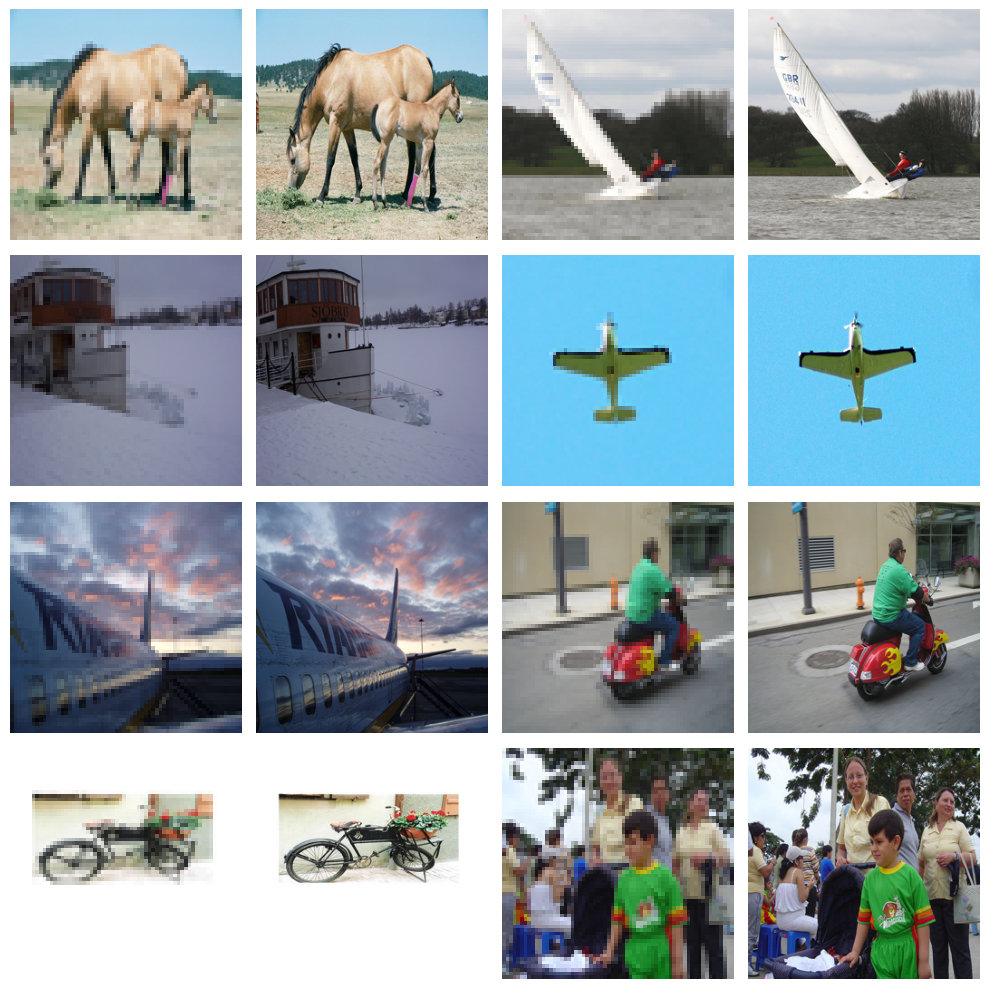

In [36]:
_, axes = plt.subplots(4, 4, figsize=(10, 10))

for i in range(8):
    low_res = train_dataset[i]["lr"]
    high_res = train_dataset[i]["hr"]

    ax = axes[i // 2, (i % 2) * 2]
    ax.imshow(np.transpose(low_res.detach().cpu().numpy(), (1, 2, 0)))
    ax.axis("off")

    ax = axes[i // 2, (i % 2) * 2 + 1]
    ax.imshow(np.transpose(high_res.detach().cpu().numpy(), (1, 2, 0)))
    ax.axis("off")

plt.tight_layout()
plt.show()



### 2.5 - Model Implementation

In [37]:
class UpscalingGan(nn.Module):
    """
    A class representing an Upscaling GAN (Generative Adversarial Network).

    Args:
        channels (int): The number of input channels.
        img_shape (tuple): The shape of the input image.

    Attributes:
        generator (nn.Module): The generator model.
        discriminator (nn.Module): The discriminator model.

    Methods:
        forward(x): Performs a forward pass through the generator.
        discriminate(x): Performs a forward pass through the discriminator.
        get_discriminator_parms(): Returns the parameters of the discriminator.
        get_generator_parms(): Returns the parameters of the generator.
        get_discriminator_output_shape(): Returns the output shape of the discriminator.
    """

    def __init__(self, channels, img_shape):
        super(UpscalingGan, self).__init__()
        self.generator = init_model(Generator(in_channels=channels))
        self.discriminator =  init_model(Discriminator(input_shape=(channels, *img_shape)))

    def forward(self, x):
        return self.generator(x)

    def discriminate(self, x):
        return self.discriminator(x)

    def get_discriminator_parms(self):
        return self.discriminator.parameters()

    def get_generator_parms(self):
        return self.generator.parameters()

    def get_discriminator_output_shape(self):
        return self.discriminator.get_output_shape()

In [38]:
model_upscaling = UpscalingGan(channels, img_shape)
criterion_content = Vgg_Loss()
criterion_GAN = GANLoss(gan_mode='lsgan').to(DEVICE)
optimizer_G = optim.Adam(model_upscaling.get_generator_parms(), lr=lr, betas=(b1, b2))
optimizer_D = optim.Adam(model_upscaling.get_discriminator_parms(), lr=lr, betas=(b1, b2))

### 2.6 - Training function

In [39]:
def train_fn(model, loader, epoch, optimizer_G, optimizer_D, criterion_GAN, criterion_content):
    """
    Trains the model for one epoch.

    Args:
        model (nn.Module): The model to be trained.
        loader (DataLoader): The data loader for loading the training data.
        epoch (int): The current epoch number.
        optimizer_G (torch.optim.Optimizer): The optimizer for the generator.
        optimizer_D (torch.optim.Optimizer): The optimizer for the discriminator.
        criterion_GAN (nn.Module): The GAN loss criterion.
        criterion_content (nn.Module): The content loss criterion.

    Returns:
        tuple: A tuple containing the average generator loss and discriminator loss for the epoch.
    """
    gen_loss = 0
    disc_loss = 0
    tqdm_bar = tqdm(loader, desc=f'Training Epoch {epoch}', total=len(loader))
    for batch_idx, imgs in enumerate(tqdm_bar):
        model.train()
        low_res = imgs["lr"].to(DEVICE)
        high_res = imgs["hr"].to(DEVICE)

        optimizer_G.zero_grad()
        # Generate high resolution images from low resolution input
        gen_hr = model(low_res)
        # Adversarial loss
        loss_GAN = 1e-3 * criterion_GAN(model.discriminate(gen_hr), True)
        loss_content = criterion_content(gen_hr, high_res)

        # Total generator loss
        loss_G = loss_content + loss_GAN
        loss_G.backward()
        optimizer_G.step()

        optimizer_D.zero_grad()
        # Discriminator loss
        loss_real = criterion_GAN(model.discriminate(high_res), True)
        loss_fake = criterion_GAN(model.discriminate(gen_hr.detach()), False)
        loss_D = loss_real + loss_fake
        loss_D.backward()
        optimizer_D.step()

        gen_loss += loss_G.item()
        disc_loss += loss_D.item()

        tqdm_bar.set_postfix(gen_loss=gen_loss/(batch_idx+1), disc_loss=disc_loss/(batch_idx+1))

    return gen_loss / len(loader), disc_loss / len(loader)

In [40]:
def validation_fn(model, loader, epoch, criterion_GAN, criterion_content):
    """
    Perform validation on the given model using the provided data loader.

    Args:
        model (torch.nn.Module): The model to be validated.
        loader (torch.utils.data.DataLoader): The data loader containing the validation data.
        epoch (int): The current epoch number.
        criterion_GAN (torch.nn.Module): The GAN loss criterion.
        criterion_content (torch.nn.Module): The content loss criterion.

    Returns:
        tuple: A tuple containing the average generator loss and discriminator loss over the validation data.
    """
    gen_loss = 0
    disc_loss = 0
    tqdm_bar = tqdm(loader, desc=f'Validation Epoch {epoch}', total=int(len(loader)))
    for batch_idx, imgs in enumerate(tqdm_bar):
        model.eval()
        with torch.no_grad():
            # Configure model input
            low_res = imgs["lr"].to(DEVICE)
            high_res = imgs["hr"].to(DEVICE)

            # Generate a high resolution image from low resolution input
            gen_hr = model(low_res)
            # Adversarial loss
            loss_GAN = 1e-3 * criterion_GAN(model.discriminate(gen_hr), True)
            # Content loss
            loss_content = criterion_content(gen_hr, high_res)
            # Total loss
            loss_G = loss_content + loss_GAN

            # Loss of real and fake images
            loss_real = criterion_GAN(model.discriminate(high_res), True)
            loss_fake = criterion_GAN(model.discriminate(gen_hr.detach()), False)
            # Total loss
            loss_D = loss_real + loss_fake

            gen_loss += loss_G.item()
            disc_loss += loss_D.item()
            tqdm_bar.set_postfix(gen_loss=gen_loss/(batch_idx+1), disc_loss=disc_loss/(batch_idx+1))

    return gen_loss / len(loader), disc_loss / len(loader)

### 2.7 - Validation function

In [41]:
test_losses = []
if TRAIN_UPSAMPLING:
    for epoch in range(epochs):
        train_gen_loss, _ = train_fn(model_upscaling, train_loader, epoch, optimizer_G, optimizer_D, criterion_GAN, criterion_content)
        val_gen_loss, _ = validation_fn(model_upscaling, val_loader, epoch, criterion_GAN, criterion_content)
        if (epoch + 1) % 5 == 0:
            plot_examples(val_loader, model_upscaling)
        test_losses.append(val_gen_loss)
        torch.save(model_upscaling.state_dict(), dir_path + f"upsampling_models/best_model_epoch_{epoch}.pth")
        print("Model saved")

## 3 - Final Model 

### 3.1 - Making Datasets and DataLoaders

In [42]:
class FinalDataset(Dataset):
    """
    A custom dataset class for loading and preprocessing images for a generative AI task.

    Args:
        files (list): A list of file paths to the images.
        img_shape (tuple, optional): The desired shape of the images. Defaults to (64, 64).

    Attributes:
        transforms (torchvision.transforms): Image transformation operations.
        files (list): A list of file paths to the images.

    Methods:
        __getitem__(self, index): Retrieves and preprocesses an image from the dataset.
        __len__(self): Returns the total number of images in the dataset.
        get_image(self, index, img_shape): Retrieves an image from the dataset without preprocessing.

    """

    def __init__(self, files, img_shape=(64,64)):
        self.transforms = transforms.Resize(img_shape,  Image.BICUBIC)
        self.files = files

    def __getitem__(self, index):
        """
        Retrieves and preprocesses an image from the dataset.

        Args:
            index (int): The index of the image to retrieve.

        Returns:
            dict: A dictionary containing the preprocessed image data, with keys 'L' and 'ab'.

        """
        img = Image.open(self.files[index]).convert("RGB")
        img = self.transforms(img)
        img = np.array(img)
        img_lab = rgb2lab(img).astype("float32") # Converting RGB to L*a*b
        img_lab = transforms.ToTensor()(img_lab)
        L = img_lab[[0], ...] / 50. - 1. # Between -1 and 1
        ab = img_lab[[1, 2], ...] / 110. # Between -1 and 1

        return {'L': L, 'ab': ab}

    def __len__(self):
        """
        Returns the total number of images in the dataset.

        Returns:
            int: The total number of images in the dataset.

        """
        return len(self.files)

    def get_image(self, index, img_shape=(256,256)):
        """
        Retrieves an image from the dataset without preprocessing.

        Args:
            index (int): The index of the image to retrieve.
            img_shape (tuple, optional): The desired shape of the image. Defaults to (256, 256).

        Returns:
            PIL.Image.Image: The image object.

        """
        img = Image.open(self.files[index]).convert("RGB")
        return transforms.Resize(img_shape,  Image.BICUBIC)(img)

In [43]:
total_test_paths = [*test_paths_colorization,*test_paths_upscaling]
final_dataset = FinalDataset(total_test_paths, img_shape=(64,64))
final_loader = DataLoader(final_dataset, batch_size=1, shuffle=False)
print(len(final_loader))

40


### 3.2 - Model Implementation

In [44]:
class FinalModel(nn.Module):
    """
    A class representing the final model for colorization and upsampling.

    Args:
        colorization_model (nn.Module): The colorization model.
        upsampling_model (nn.Module): The upsampling model.

    Attributes:
        colorization_model (nn.Module): The colorization model.
        upsampling_model (nn.Module): The upsampling model.

    Methods:
        forward(data): Performs the forward pass of the final model.

    """

    def __init__(self, colorization_model, upsampling_model):
        super(FinalModel, self).__init__()
        self.colorization_model = colorization_model
        self.upsampling_model = upsampling_model

    def forward(self, data):
        # Colorization step
        colorized_output = self.colorization_model(data)
        fake_color = self.colorization_model.fake_color.detach()
        colorized_img = lab_to_rgb(self.colorization_model.L, fake_color)

        tensor_imgs = []
        to_tensor = transforms.ToTensor()

        for img_array in colorized_img:
            img_array = (img_array * 255).astype(np.uint8)  # Ensure the image is in uint8 format
            pil_img = Image.fromarray(img_array)
            tensor_img = to_tensor(pil_img)
            tensor_imgs.append(tensor_img)

        batch_tensor = torch.stack(tensor_imgs)
        batch_tensor = batch_tensor.to(torch.float32).to(DEVICE)

        # Upsampling step
        upscaled_output = self.upsampling_model(batch_tensor)
        return upscaled_output

In [58]:
from torchmetrics.functional.image import structural_similarity_index_measure as ssim
def plot_test(loader, model):
    """
    Plot the initial image, original image, and predicted image with MSE distance.

    Args:
        loader (torch.utils.data.DataLoader): DataLoader object containing the images.
        model (torch.nn.Module): Model used for image prediction.

    Returns:
        None
    """
    to_tensor = transforms.ToTensor()
    for idx, imgs in enumerate(loader):
        fig, axs = plt.subplots(1, 3, figsize=(12, 4))
        original_np = imgs['L'][0].permute(1, 2, 0).cpu().numpy()
        original_np = np.clip((original_np + 1) * 50, 0, 100).astype(np.uint8)

        axs[0].set_axis_off()
        axs[0].imshow(original_np, cmap='gray')
        axs[0].set_title(f"Initial Image")

        axs[1].set_axis_off()
        axs[1].imshow(loader.dataset.get_image(idx))
        axs[1].set_title(f"Original Image")

        real_img = to_tensor(loader.dataset.get_image(idx)).unsqueeze(0).to(DEVICE)

        with torch.no_grad():
            final_img = model(imgs)

        similarity = ssim(final_img, real_img)
        final_img = final_img.squeeze().permute(1, 2, 0).cpu().numpy()
        final_img = np.clip(final_img, 0, 1)  # Ensure the values are in the range [0, 1]
        
        axs[2].set_axis_off()
        axs[2].imshow(final_img)
        axs[2].set_title(f"Predicted Image with SSIM {similarity:.3f}")

        plt.show()

### 3.3 - Testing Final Model

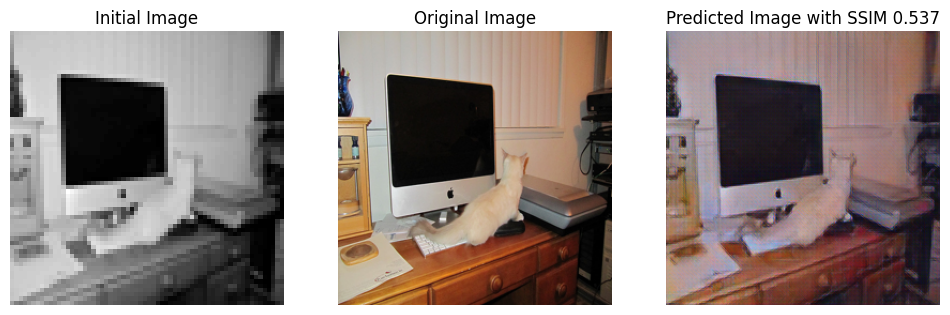

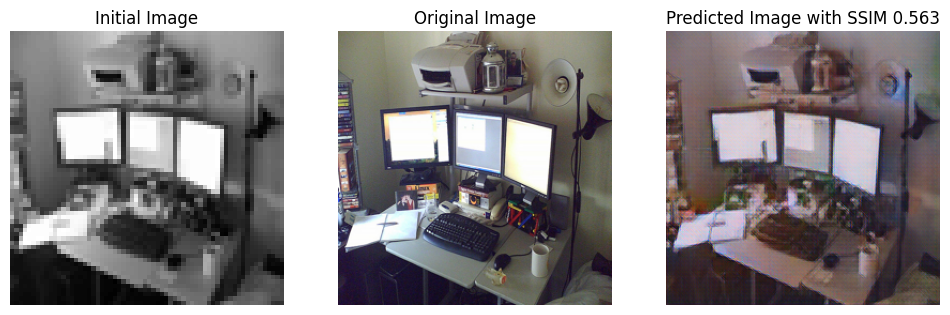

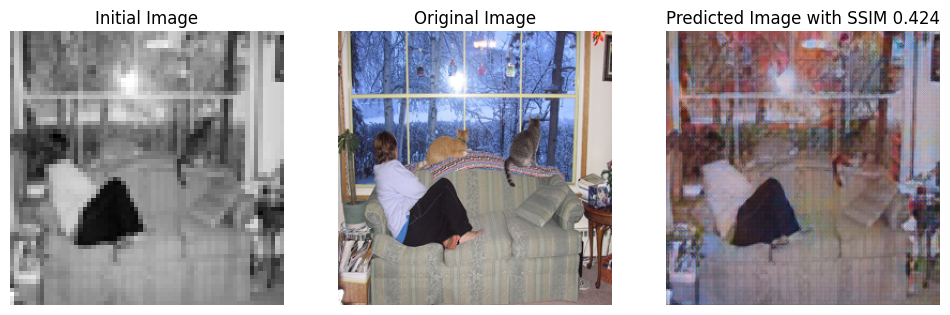

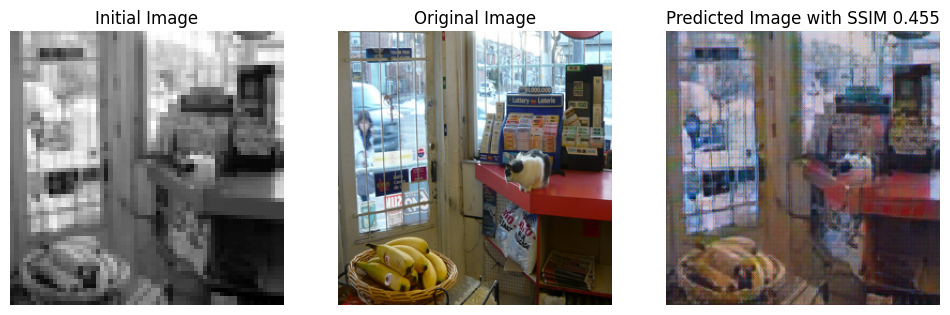

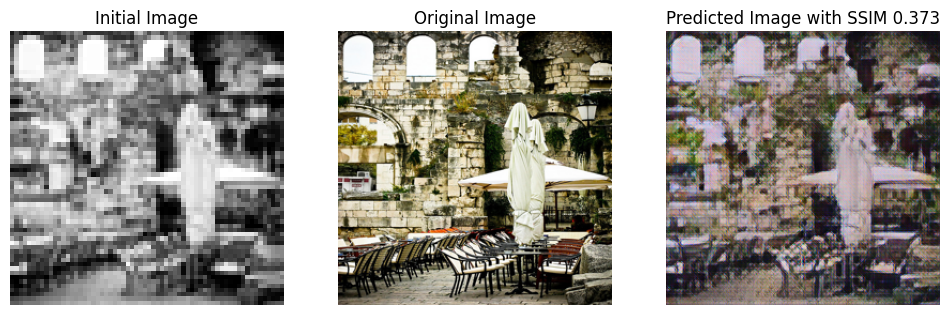

...

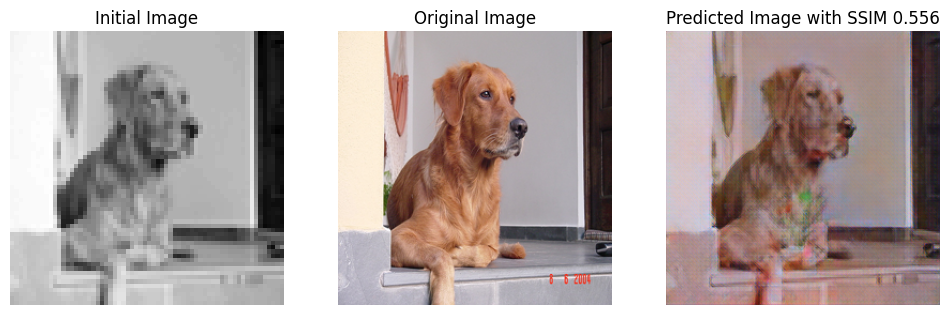

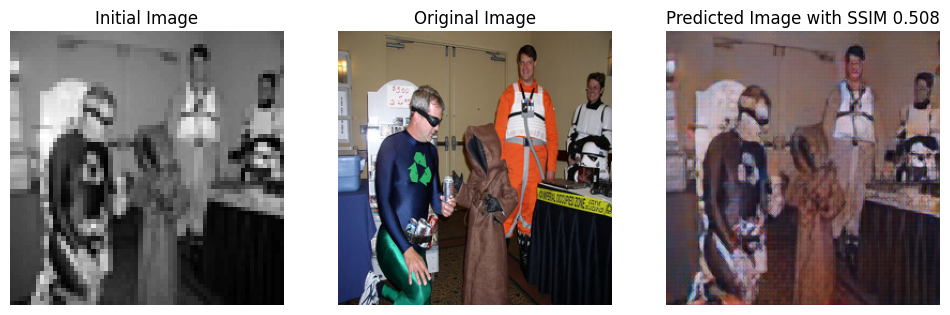

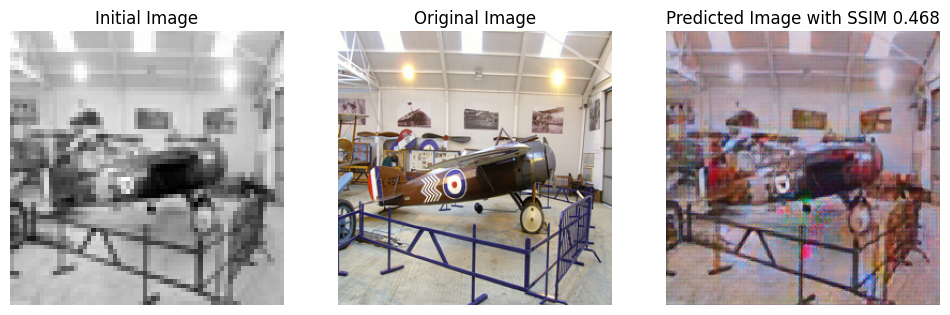

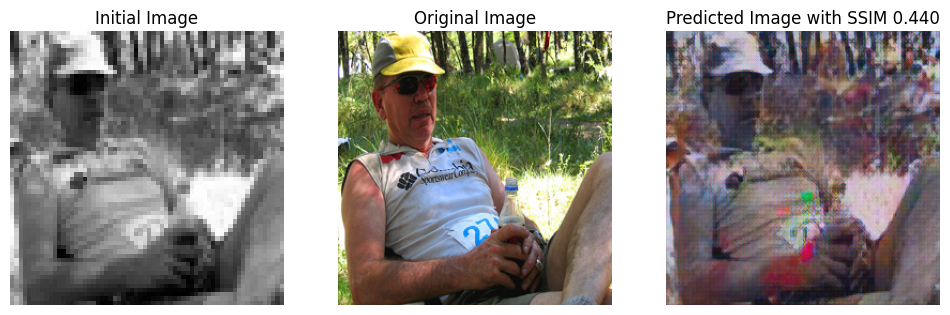

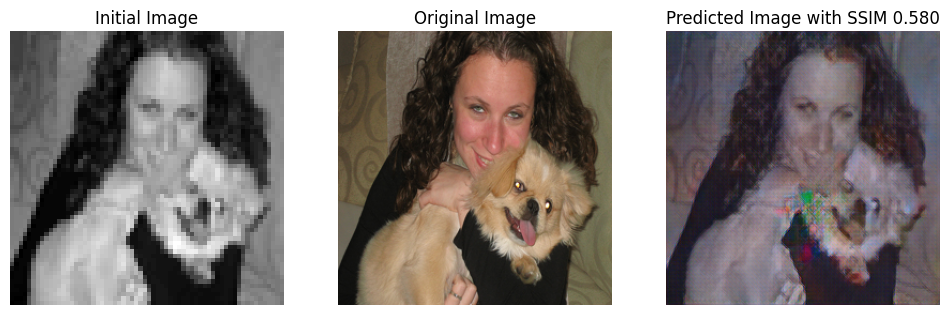

In [59]:
colorization_model = ColorizationGan(lr_G=lr, lr_D=lr)
colorization_model.load_state_dict(torch.load(dir_path + "best_colorization_model.pth", map_location=torch.device(DEVICE)))
upsampling_model = UpscalingGan(channels, img_shape)
upsampling_model.load_state_dict(torch.load(dir_path + "best_upscaling_model.pth", map_location=torch.device(DEVICE)))
final_model = FinalModel(colorization_model, upsampling_model).to(DEVICE)

final_model.eval()
with torch.no_grad():
    plot_test(final_loader, final_model)